In [1]:
## For tutorial #1, we will use a previously analyzed data set so we can load parameters from a config file.
    ## In this tutorial script, we will initialize a Drone_Data and Corr_Data class.
    ## Then, we will combine them into a CONCAT class and use some plotting functions.
    ## Be sure to install the python package according to the instructions in the readme prior to running!
    ## I've tried to heavily comment this in pursuit of two objectives:
        ## 1) The thought process behind how and when we use these functions
        ## 2) To illustrate how/why we tune variables and parameters when needed

## Here is a list of objectives for this tutorial. Try to find (cmd-f) these numbers in the commented sections:
    # 1)  - Import our class functions and verify installation
    # 2)  - Load Drone Data
    # 3)  - Load Correlator Data
    # 4)  - Initialize a concat class for a PULSED GRID FLIGHT
    # 5)  - Perform a series of analysis functions on the concat class...
    # 5A) - concat Function: Extract_Source_Pulses
    # 5B) - concat Function: Perform_Background_Subtraction
    # 5C) - concat Function: Synchronization_Function
    # 5D) - concat Function: Export_yaml
    # 5E) - concat Function: Main_Beam_Fitting

In [2]:
## OBJECTIVE 1: Import our class functions and verify installation

## First import general packages for running python analysis:
import os
import numpy as np
from matplotlib.pyplot import *
import h5py
import datetime
import pytz

## Then import the beamcals module packages and initialize 'gbosite' class:
from beamcals import corr
from beamcals import concat
from beamcals import drone
from beamcals import bicolog
import beamcals.plotting_utils as pu
import beamcals.fitting_utils as fu
import beamcals.geometry_utils as gu
import beamcals.time_utils as tu
from beamcals.sites import site
gbosite=site.site('../beamcals/beamcals/sites/GBO_config.npz')

In [3]:
## OBJECTIVE 2: Load Drone Data

## Read in the Drone_Data class, lets choose "FLY653.csv":
## We'll use the minimum necessary input parameters:
    # FLYTAG - the filename of the selected file
    # Drone_Directory - the directory location containing the file
    # site_class - the site config class, which we defined above as 'gbosite'
## The following input parameters will be left to their default setting:
    # skip_rows=range(500).tolist() - this is how many rows are skipped to omit NAN values.
dronedir='/hirax/all_drone_data/datcon_csv/'
dronetest0825=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY533.csv',site_class=gbosite)

Initializing drone data via datcon_csv routine: FLY533.csv
  --> Skipping rows 1 to 499 to eliminate NAN values
  --> Attempting to load position data from RTK
    --> RTK data contains 13308/13308 non-nan values
Timestamp interpolation succeeded
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.


In [4]:
## OBJECTIVE 3: Load Correlator Data

## Read in the Corr_Data class, corresponding to the "FLY653.csv" file.
## We'll use the minimum necessary input parameters:
    # Data_Directory - the directory location containing the correlator files
    # Gain_Directory - the directory location containing the gain file
    # site_class - the site config class, which we defined above as 'gbosite'
## The following input parameters will be left to their default setting:
    # Data_File_Index=None - data files to use (default --> all files)
    # Load_Gains=True
    # Fix_Gains=False - should we apply a fixed gain in each channel? (only use when known from config)
    # Apply_Gains=True - if set to False, the V arrays will contain uncalibrated "raw" data
    # Gain_Params=[1.0, 24.0] - if applying a fixed gain, the gain in each channel will be: 1.0*(10**24.0)
    # fbounds=[0, -1] - what frequency bounds should we pull from the visibility matrix?
datadir='/hirax/GBO_Aug_2021/TONE_ACQ/20210826T182904Z_yale_drone/corr/20210826T182915Z/'
gaindir='/hirax/GBO_Aug_2021/TONE_ACQ/digital_gains/20210826T182904Z_yale_drone_yale_digitalgain/'
corrtest0825=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=gbosite)

Initializing Correlator Class using:
  --> /hirax/GBO_Aug_2021/TONE_ACQ/20210826T182904Z_yale_drone/corr/20210826T182915Z/
  --> Arrays initialized with shape (124, 256, 1024, 16)
Assigning array values by reading in data files:
  --> Loading File: 0123/0123
  --> Finished. Reshaping arrays.


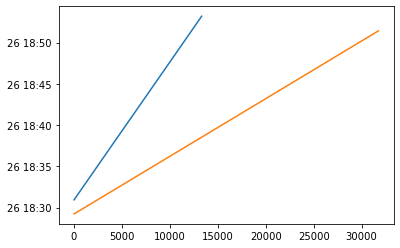

In [5]:
## Just to illustrate that these two files correspond to the same times, let's plot their datetime arrays:
plot(dronetest0825.t_arr_datetime)
plot(corrtest0825.t_arr_datetime)

In [6]:
## OBJECTIVE 4: Initialize a concat class for a PULSED GRID FLIGHT

## Since we know the data are from the same time we can combine them with the Concat_Class:
## There are a few binary flags we should specify when we concat these inputs: (these are their default parameters)
    ## load_yaml=True       # This allows us to check for config files from previous analyses
    ## traceback=True       # Do we want print statements and verification plots to show?
    ## save_traceback=True  # This will allow us to save the verification plots!
## Specify directory parameter that allows you to specify where to look for previous config files:
    ## config_directory="/hirax/GBO_Analysis_Outputs/concat_config_files/"
## Specify directory parameter that allows you to specify where to save output plots and generate subdirectory:
    ## output_directory='/hirax/GBO_Analysis_Outputs/
    
## For this tutorial, I'm setting save_traceback to False, so we don't generate a bunch of duplicates
## Reading the traceback will show you what the script is doing and has lots of valuable information!
    ## If you are running this on rubin, you should have 5 saved parameters loaded from the config:
        ##  --> pulse_period = 400000.0
        ##  --> pulse_dutycycle = 200000.0
        ##  --> t_delta_pulse = -0.2136631146346346
        ##  --> t_delta_dji = -1.32000000000003
        ##  --> copolchan = 1.0
        
concattest0825=concat.CONCAT(CORRDATCLASS=corrtest0825,DRONEDATCLASS=dronetest0825,\
                             load_yaml=True,traceback=True,save_traceback=False)

Initializing CONCAT CLASS with active traceback using:
  --> /hirax/GBO_Aug_2021/TONE_ACQ/20210826T182904Z_yale_drone/corr/20210826T182915Z/
  --> FLY533.csv
  --> Traceback outputs will not be saved...
Searching for previous config file:
  --> Checking directory for config_FLY533_20210826T182904Z.yaml:
    --> FILE EXISTS
    --> Loading existing config file parameters...
      --> pulse_period = 400000.0
      --> pulse_dutycycle = 200000.0
      --> t_delta_pulse = -0.2136631146346346
      --> t_delta_dji = -1.32000000000003
      --> copolchan = 1.0
Interpolating drone coordinates for each correlator timestamp:
  --> correlator timestamp axis contains 29304 elements
  --> drone timestamp axis contains 13308 elements


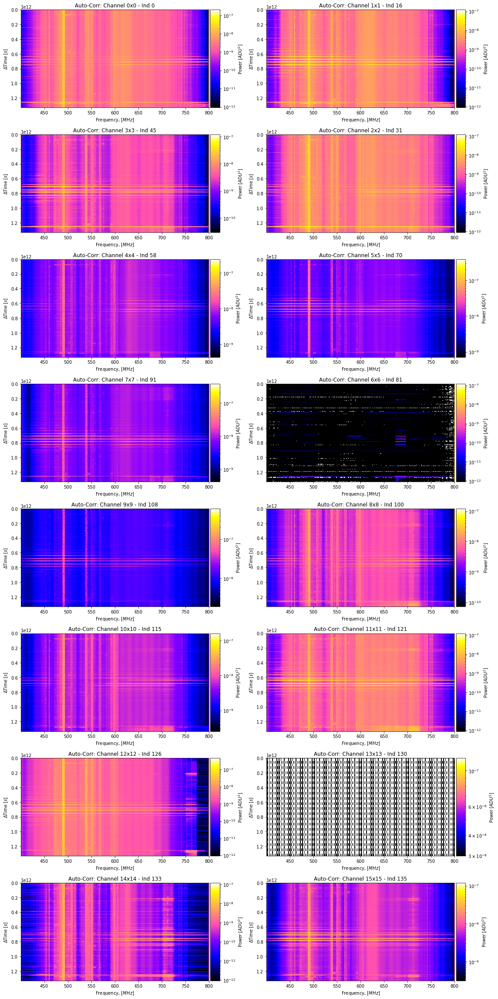

In [7]:
## What does our correlator data look like? We can consider a waterfall plot:
    ## If we see horizontal stripes, that means at some time, a lot of power was seen across all frequencies
    ## If we see vertical stripes, we know that some frequencies have more power than their neighbors for all time
    ## a grid flight should look like a series of horizontal stripes at regular intervals!
## Use plotting functions to produce a waterfall plot of the Concat_Class:
pu.Plot_Waterfalls(concattest0825)

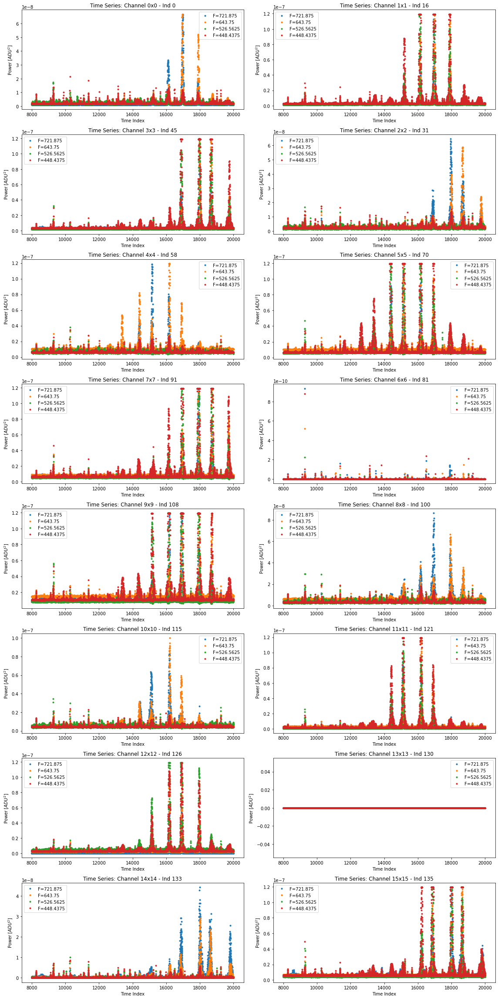

In [8]:
## What if we only want to look at a few frequencies and see a time series graph:
    ## The peaks are where the intensity is high, i.e. RFI events and when the drone is transiting...
    ## We can change the time and frequency indices to alter the contents of the graph...
## Use plotting functions to produce a time series plot of the Concat_Class, specify t and f bounds:
pu.Plot_Time_Series(concattest0825,tbounds=[8000,20000],freqlist=[200,400,700,900])

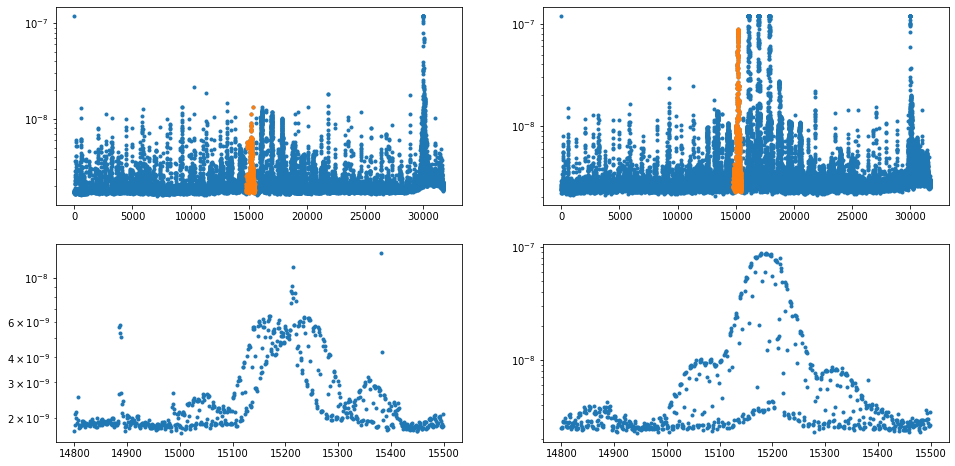

In [9]:
## Let's find the time bounds for a central transit, and examine those bounds when we solve for the source pulses:
tlb,tub=[14800,15500]
find=900

fig=figure(figsize=(16,8))
for i in range(concattest0825.n_channels)[:2]:
    ax1=fig.add_subplot(2,2,i+1)
    ax2=fig.add_subplot(2,2,i+3)
    ax1.semilogy(concattest0825.t_index[:],concattest0825.V[:,find,concattest0825.chmap[i]],'.')
    for ax in [ax1,ax2]:
        ax.semilogy(concattest0825.t_index[tlb:tub],concattest0825.V[tlb:tub,find,concattest0825.chmap[i]],'.')

## So we've identified time bounds where we can see the pulsing source transit!
    ## Infact, I think we are seeing a sidelobe on channel 1!
    ## Let's see if we can extract the on/off indices...

Extracting Source Pulses using parameters loaded from config file:
  --> pulse_period = 400000.0
  --> pulse_dutycycle = 200000.0
  --> t_delta_pulse = -0.2136631146346346
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []


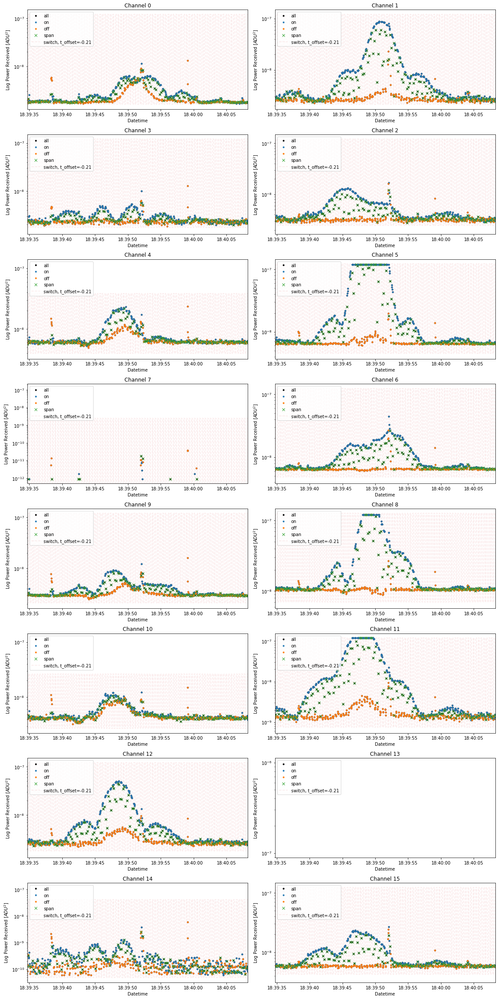

In [10]:
## OBJECTIVE 5A: concat Function: Extract_Source_Pulses

## Let's use the Extract_Source_Pulses function:
    # The Period and Dutycycle options are known beforehand, and given in microseconds.
    # The t_bounds option just determines the plot bounds, not the solving routine.
## Fortunately, these parameters are loaded from the config, so we don't have to wait for the solver to run.
    ## The returned t_delta_pulse parameter will be given in seconds.
    ## In the verification plot, we should see the following points plotted:
        # orange_o = inds_off  = times when the source is off
        # blue_o   = inds_on   = times when the source is on and broadcasting
        # green_x  = inds_span = times where the behavior changes during the integration period (omit always!)
    ## The print statements shows the list of indices that appear in more than one of on/off/span.
        ## If they are all empty lists [], then there is no overlap which is a good thing.
concattest0825.Extract_Source_Pulses(Period=0.4e6,Dutycycle=0.2e6,t_bounds=[14800,15600])

In [11]:
## OBJECTIVE 5B: concat Function: Perform_Background_Subtraction

## Let's do background subtraction: creates computed background (V_bg) and background-subtracted (V_bgsub) arrays:
    # window_size=5 - this is 1/2 the width of the 'index window' across which the background is averaged.
    # This function only works if the source was pulsed and Extract_Source_Pulses was used!
concattest0825.Perform_Background_Subtraction(window_size=5)

Calculating background spectra from indices where the noise source is off.


/home/tyndall/anaconda3/lib/python3.8/site-packages/beamcals/concat.py:314: RuntimeWarning: Mean of empty slice
  self.V_bg[k,:,:]=np.nanmean(self.V[t_window,:,:],axis=0)


  --> Background subtraction completed using window_size = 5


Synchronizing data from correlator and drone:
  --> Loading parameter from existing configuration file: t_delta_dji = -1.32000000000003
Applying a time correction of -1.32 seconds using Channel 1.0 fits.
  --> Variable synchronation successful, generating output plots:


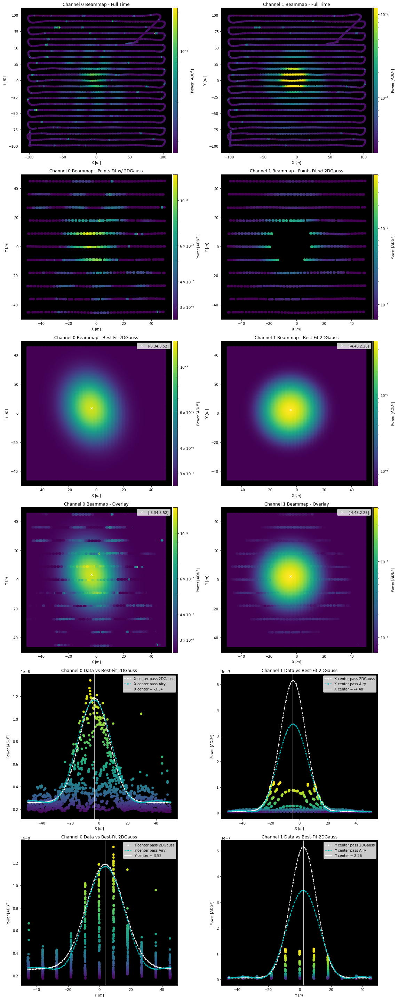

In [12]:
## OBJECTIVE 5C: concat Function: Synchronization_Function

## This function finds the absolute timing shift between the dji data from the drone and the correlator
    ## We will be loading t_delta_dji from the config file to save some time!
    ## This function only works if the source was pulsed and if V_bgsub was created using background subtraction.
    ## This function works by zooming into the gaussian main beam and removing saturated data points...
## To run, you must give the following:
    ## inputcorr  = the corr class used in the concat
    ## inputdrone = the drone class used in the concat
## The optional parameters and their default values are listed below:
    ## coarse_params=[-10.0,10.0,0.2]    = the min,max,step parameters for the coarse time offset array
    ## fine_params=[-0.5,0.5,0.01]       = the min,max,step parameters for the fine time offset array
    ## chans=np.arange(0,2)              = the channels to fit. 0,1 gives us each polarization
    ## freqs=np.arange(100,1024,150)     = the min,max,step parameters for the freq array axis
    ## FMB_coordbounds=[50.0,50.0,150.0] = the cartesian coords we restrict around the main beam
        # x within +/- 50m from dish center in Local Cartesian (LC)
        # y within +/- 50m from dish center in Local Cartesian (LC)
        # z > 150m from dish center in Local Cartesian (LC)
    ## FMB_ampbound=0.999                = amplitude percentile threshold for saturation... 
        # time indices where the amplitude exceeds 0.999*maximum value are excluded because they are saturated

concattest0825.Synchronization_Function(inputcorr=corrtest0825,inputdrone=dronetest0825,FMB_coordbounds=[50.0,50.0,150.0],FMB_ampbound=0.999)

## Since we are loading from the config, we get to skip an iterative loop and just take the solution and apply it.
    ## The verification plot shown is hidden when traceback==False is set in the concat initialization
    ## Look closely at the verification plots to see which channel appears to be the co-pol (channel 1)
    ## In the bottom 2 panels, compare the fit result (white gaussian) to the data points (in color)
        ## We are omitting the saturated points to find the REAL max value, instead of squashing our peak
        ## If we are satisfied with this fit, we should try to save the parameters we found...

In [13]:
## OBJECTIVE 5D: concat Function: Export_yaml

## When we have results we want to save, we should export our results to a config file for future use:
    ## The file will be written to the directory stated when the concat class was initialized.
    ## If a concat config yaml file already exists, a new version will be saved.
## Uncomment this if you want to export a config file... 
#concattest0825.Export_yaml()

In [14]:
## OBJECTIVE 5E: concat Function: Main_Beam_Fitting

## Now we can do some analysis, since we have synchronized useful data. We can begin by fitting the main beam:
    ## You can specify the directory where you want the fit params to be output:
    ## fit_param_directory='/hirax/GBO_Analysis_Outputs/main_beam_fits/'
    ## This one sometimes takes a while, feel free to get a coffee or something.
concattest0825.Main_Beam_Fitting()

Performing 2DGauss and Airy fits for [16]chans x [1024]freqs:


/home/tyndall/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/tyndall/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3943: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coefficent may be inaccurate.
  warnings.warn(PearsonRNearConstantInputWarning())


In [15]:
## Now we can examine the Gaussian results, if we so choose:
    #print channel 1, freq 900, all gauss params: [amp0,x00,xsig0,y00,ysig0,theta0,bg0]
print(concattest0825.G_popt[1,900,:])

[ 5.08404263e-07 -4.48225361e+00  8.67874703e+00  2.26281652e+00
  8.24434560e+00 -4.48206240e-02  6.32943272e-09]


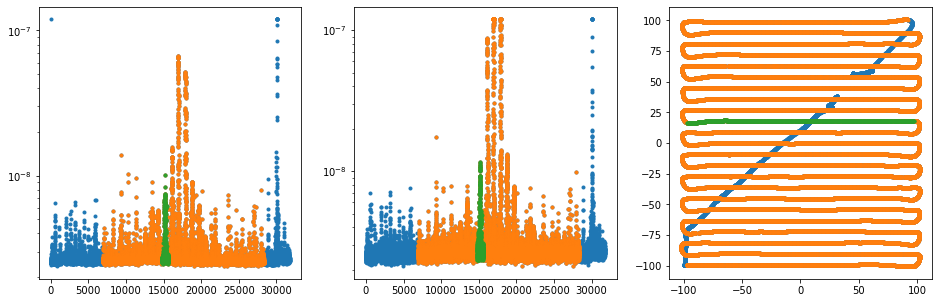

In [16]:
## Let's make a nice beammap using the data we just analyzed:
    ## First lets find time index bounds that select only the nice grid passes, no extra stuff: [6900,28300]
    ## These points appear as orange, and show just the grid in graph 3:
fig1,[ax1,ax2,ax3]=subplots(nrows=1,ncols=3,figsize=(16,5))
tlb,tub=[0,-1]
ax1.semilogy(concattest0825.t_index[tlb:tub],concattest0825.V[tlb:tub,400,0],'.')
ax2.semilogy(concattest0825.t_index[tlb:tub],concattest0825.V[tlb:tub,400,1],'.')
ax3.plot(concattest0825.drone_xyz_LC_interp[tlb:tub,0],concattest0825.drone_xyz_LC_interp[tlb:tub,1],'.')
tlb,tub=[6900,28300]
ax1.semilogy(concattest0825.t_index[tlb:tub],concattest0825.V[tlb:tub,400,0],'.')
ax2.semilogy(concattest0825.t_index[tlb:tub],concattest0825.V[tlb:tub,400,1],'.')
ax3.plot(concattest0825.drone_xyz_LC_interp[tlb:tub,0],concattest0825.drone_xyz_LC_interp[tlb:tub,1],'.')
tlb,tub=[14800,15600]
ax1.semilogy(concattest0825.t_index[tlb:tub],concattest0825.V[tlb:tub,400,0],'.')
ax2.semilogy(concattest0825.t_index[tlb:tub],concattest0825.V[tlb:tub,400,1],'.')
ax3.plot(concattest0825.drone_xyz_LC_interp[tlb:tub,0],concattest0825.drone_xyz_LC_interp[tlb:tub,1],'.')

/home/tyndall/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:171: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order, subok=True)


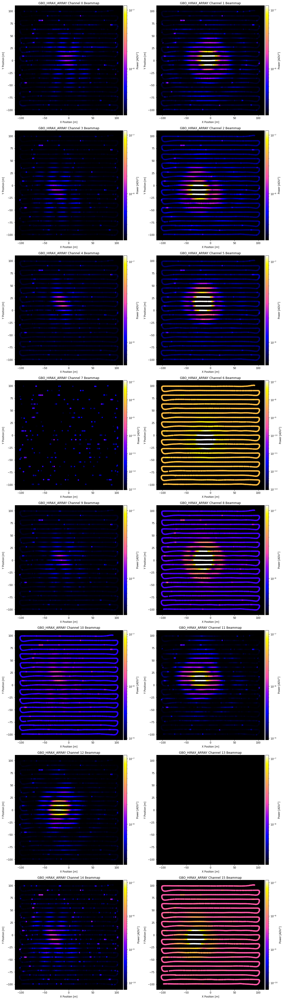

In [17]:
## Now we can execute the Plot_Beammap function from plotting_utils.py:
    ## We should use the t_bounds we just found [6900,28300] to restrict to a nice grid
    ## We can choose coord_args to see if we want cartesian or polar: {"LC","Pol"}
    ## We can choose pulse_args to see what correlator data we want: {None,"on","off","bg","bgsub"}
    
## First lets see the source on indices in cartesian:
pu.Plot_Beammap(concattest0825,coord_args='LC',pulse_args="on",\
                t_bounds=[6900,28300],f_bounds=[900,910],cbounds=[],dotsize=20)

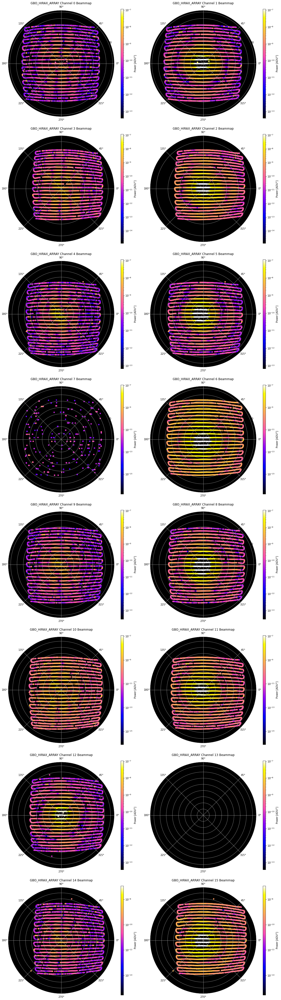

In [18]:
## We can also look at, for instance, the Polar background subtracted beammap:
pu.Plot_Beammap(concattest0825,coord_args='Pol',pulse_args='bgsub',\
                t_bounds=[6900,28300],f_bounds=[900,910],cbounds=[],dotsize=20)

for a sample data set of 300 time indices...
--> the timestep is are 0.04194304 sec
--> the total duration is  12.582912 sec
--> the distance travelled is 73.40260962093336 m
--> the angular distance travelled is 23.080870315617943 deg
--> the average velocity is 5.833515296056538 m/s
--> the angular velocity is 1.8343027683590207 deg/s
--> the angular step size (per time index) is 0.07693623438539314 deg


0.04194304

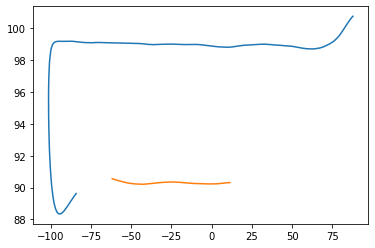

In [47]:
plot(concattest0825.drone_xyz_LC_interp[6920:7800,0],concattest0825.drone_xyz_LC_interp[6920:7800,1])
plot(concattest0825.drone_xyz_LC_interp[7900:8200,0],concattest0825.drone_xyz_LC_interp[7900:8200,1])
dx=(concattest0825.drone_xyz_LC_interp[8200,0]-concattest0825.drone_xyz_LC_interp[7900,0])
dt=((concattest0825.t_arr_datetime[8200]-concattest0825.t_arr_datetime[7900]).total_seconds())

print("for a sample data set of {} time indices...".format(str(300)))
print("--> the timestep is are {} sec".format(concattest0825.tstep))
print("--> the total duration is  {} sec".format(dt))
print("--> the distance travelled is {} m".format(dx))
print("--> the angular distance travelled is {} deg".format(180/np.pi*np.arctan(dx/np.nanmean(concattest0825.drone_xyz_LC_interp[7900:8200,2]))))
print("--> the average velocity is {} m/s".format(dx/dt))
print("--> the angular velocity is {} deg/s".format(180/np.pi*np.arctan(dx/np.nanmean(concattest0825.drone_xyz_LC_interp[7900:8200,2]))/dt))
print("--> the angular step size (per time index) is {} deg".format(180/np.pi*np.arctan(dx/np.nanmean(concattest0825.drone_xyz_LC_interp[7900:8200,2]))/300))


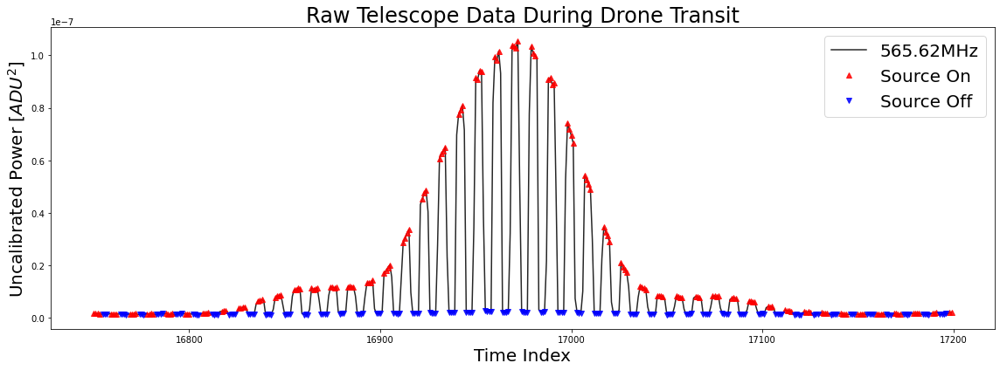

In [135]:
## Plot for Maile:
fig,ax1=subplots(nrows=1,ncols=1,figsize=(16,6))
for freq in [600]:
    plot(concattest0825.t_index[16750:17200],concattest0825.V[16750:17200,freq,1],'k',alpha=0.85,label="{:.2f}MHz".format(concattest0825.freq[freq]))
    t_custom=np.intersect1d(concattest0825.inds_on,concattest0825.t_index[16750:17200])
    plot(t_custom,concattest0825.V[t_custom,freq,1],'r^',alpha=0.85,label="Source On")
    t_custom=np.intersect1d(concattest0825.inds_off,concattest0825.t_index[16750:17200])
    plot(t_custom,concattest0825.V[t_custom,freq,1],'bv',alpha=0.85,label="Source Off")

ax1.set_title("Raw Telescope Data During Drone Transit",size=24)
ax1.set_ylabel("Uncalibrated Power [$ADU^2$]",size=20)
ax1.set_xlabel("Time Index",size=20)
ax1.legend(fontsize=20)
tight_layout()